In [1]:
import optuna as opt
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
#from twilio.rest import Client
import pickle

import time

import sys
import os 






import os
os.environ["OPENBLAS_NUM_THREADS"] = "1"
sys.path.append('../../pscapes')
sys.path.append('../../nk-ml-2024/')


from torch.utils.data import DataLoader
from pscapes.landscape_class import ProteinLandscape
from pscapes.utils import dict_to_np_array, np_array_to_dict

from src.architectures import SequenceRegressionCNN, SequenceRegressionLinear, SequenceRegressionMLP, SequenceRegressionLSTM, SequenceRegressionTransformer

from src.ml_utils import train_val_test_split_ohe, landscapes_ohe_to_numpy
from src.hyperopt import objective_NK, sklearn_objective_NK

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor 

from src.train_utils import train_models_from_hparams_NK, read_MLP_hparams, read_CNN_hparams, read_LSTM_hparams, read_transformer_hparams, instantiate_model_from_study

from src.analysis import get_latent_representation
import matplotlib.pyplot as plt
from sklearn.neighbors import kneighbors_graph
import math
import networkx as nx
from scipy.sparse import diags

import torchmetrics
from torchmetrics.regression import SpearmanCorrCoef, PearsonCorrCoef
from src.analysis import adjacency_to_diag_laplacian, sparse_dirichlet


In [2]:
#set global parameters
HPARAM_PATH = '../hyperopt/results/NK_hyperopt_results.pkl'
DATA_PATH = '../data/nk_landscapes/'
MODEL_SAVEPATH = '../models/models_K3/'
RESULT_PATH = '../results/results_K3/NK_train_test_results.pkl'
SEQ_LEN = 6
AA_ALPHABET  = 'ACDEFG'
N_REPLICATES = 4

In [3]:
#load landscapes
#load landscape data 
landscapes = []
print('Loading landscapes.')
for k in range(SEQ_LEN):
    replicate_list = []
    for r in range(N_REPLICATES):
        landscape = ProteinLandscape(csv_path=DATA_PATH+'/k{0}_r{1}.csv'.format(k,r), amino_acids=AA_ALPHABET)
        replicate_list.append(landscape)
    landscapes.append(replicate_list)
landscapes = [[i.fit_OHE() for i in j] for j in landscapes]

print('Calculating train-test-val splits')
splits = [train_val_test_split_ohe(i, random_state=1) for i in landscapes]
#landscapes_ohe, xy_train, xy_val, xy_test, x_tests, y_tests = splits[k_index] 

Loading landscapes.
Calculating train-test-val splits


In [4]:
#load hparam studies 
with open(HPARAM_PATH, 'rb') as handle: 
    NK_hparams = pickle.load(handle)

In [5]:
model_names = ['linear', 'mlp', 'cnn', 'ulstm', 'blstm', 'transformer']
NK_hparams_k3 = {x:[NK_hparams[x][3] for _ in range(SEQ_LEN)] for x in NK_hparams.keys()}

## Test set performance

In [6]:
#instantiate models with the correct hyperparameters from hparam optimisation
linear_models = [[instantiate_model_from_study('linear', i) for r in range(N_REPLICATES)] for i in NK_hparams_k3['linear']]
mlp_models    = [[instantiate_model_from_study('mlp', i) for r in range(N_REPLICATES)] for i in NK_hparams_k3['mlp']]
cnn_models    = [[instantiate_model_from_study('cnn', i) for r in range(N_REPLICATES)] for i in NK_hparams_k3['cnn']]
ulstm_models   = [[instantiate_model_from_study('ulstm', i) for r in range(N_REPLICATES)] for i in NK_hparams_k3['ulstm']]
blstm_models   = [[instantiate_model_from_study('blstm', i) for r in range(N_REPLICATES)] for i in NK_hparams_k3['blstm']]
transformer_models   = [[instantiate_model_from_study('transformer', i) for r in range(N_REPLICATES)] for i in NK_hparams_k3['transformer']]

#cnn_models = [[instantiate_model_from_study('cnn', i)] for i in NK_hparams['cnn']] 
#ulstm_models = [[instantiate_model_from_study('ulstm', i)] for i in NK_hparams['ulstm']] 

In [7]:
#load model parameters 
[[linear_models[k_val][replicate].load_state_dict(torch.load(MODEL_SAVEPATH+'{}_NK_k{}_r{}.pt'.format('linear', k_val, replicate), weights_only=True)) 
  for replicate in range(N_REPLICATES)] for k_val in range(SEQ_LEN)] #load weights
[[mlp_models[k_val][replicate].load_state_dict(torch.load(MODEL_SAVEPATH+'{}_NK_k{}_r{}.pt'.format('mlp', k_val, replicate), weights_only=True)) 
  for replicate in range(N_REPLICATES)] for k_val in range(SEQ_LEN)]
[[cnn_models[k_val][replicate].load_state_dict(torch.load(MODEL_SAVEPATH+'{}_NK_k{}_r{}.pt'.format('cnn', k_val, replicate), weights_only=True)) 
  for replicate in range(N_REPLICATES)] for k_val in range(SEQ_LEN)]
[[ulstm_models[k_val][replicate].load_state_dict(torch.load(MODEL_SAVEPATH+'{}_NK_k{}_r{}.pt'.format('ulstm', k_val, replicate), weights_only=True)) 
  for replicate in range(N_REPLICATES)] for k_val in range(SEQ_LEN)]
[[blstm_models[k_val][replicate].load_state_dict(torch.load(MODEL_SAVEPATH+'{}_NK_k{}_r{}.pt'.format('blstm', k_val, replicate), weights_only=True)) 
  for replicate in range(N_REPLICATES)] for k_val in range(SEQ_LEN)]
[[transformer_models[k_val][replicate].load_state_dict(torch.load(MODEL_SAVEPATH+'{}_NK_k{}_r{}.pt'.format('transformer', k_val, replicate), weights_only=True)) 
  for replicate in range(N_REPLICATES)] for k_val in range(SEQ_LEN)]

[[<All keys matched successfully>,
  <All keys matched successfully>,
  <All keys matched successfully>,
  <All keys matched successfully>],
 [<All keys matched successfully>,
  <All keys matched successfully>,
  <All keys matched successfully>,
  <All keys matched successfully>],
 [<All keys matched successfully>,
  <All keys matched successfully>,
  <All keys matched successfully>,
  <All keys matched successfully>],
 [<All keys matched successfully>,
  <All keys matched successfully>,
  <All keys matched successfully>,
  <All keys matched successfully>],
 [<All keys matched successfully>,
  <All keys matched successfully>,
  <All keys matched successfully>,
  <All keys matched successfully>],
 [<All keys matched successfully>,
  <All keys matched successfully>,
  <All keys matched successfully>,
  <All keys matched successfully>]]

In [8]:
models_dict = {'linear': linear_models, 'mlp': mlp_models, 'cnn':cnn_models, 'ulstm': ulstm_models, 'blstm': blstm_models, 
               'transformer': transformer_models}

In [9]:
from sklearn.metrics import r2_score


In [10]:
#evaluate models
device = 'cpu'
results = {}
loss_fn = nn.MSELoss()
for model_name in model_names: 
    model_results = []
    for k_val in range(SEQ_LEN): 
        k_results = []
        landscapes_ohe, xy_train, xy_val, xy_test, x_tests, y_tests = splits[k_val]
        for replicate_index in range(N_REPLICATES): 
            model = models_dict[model_name][k_val][replicate_index] 
            model.to(device)
            model.eval()        
            x_test   = x_tests[replicate_index].to(device)
            y_test   = y_tests[replicate_index].to(device)             
            y_pred   = model(x_test) #get predictions
            y_pred   = y_pred.detach() #detach tensors 
            y_test   = y_test.detach()            
            test_mse = loss_fn(y_pred, y_test).item() #MSE 
            spearman = SpearmanCorrCoef()
            pearson  = PearsonCorrCoef()
            pearsonr  = pearson(y_pred, y_test).item()
            spearmanr = spearman(y_pred, y_test).item()
            y_pred, y_test   = y_pred.cpu().numpy(), y_test.cpu().numpy() 
            #print('Model: {}, K = {}, R = {}, STD of y_pred = {}, STD of y_test = {}'.format(model_name, k_val, 
                                                                                             #replicate_index, np.std(y_pred), np.std(y_test))
            test_r2  = r2_score(y_pred, y_test) #R^2
            replicate_results = [test_r2, test_mse, pearsonr, spearmanr]
            k_results.append(replicate_results)
        model_results.append(k_results)
    results[model_name]=np.array(model_results)
        
    

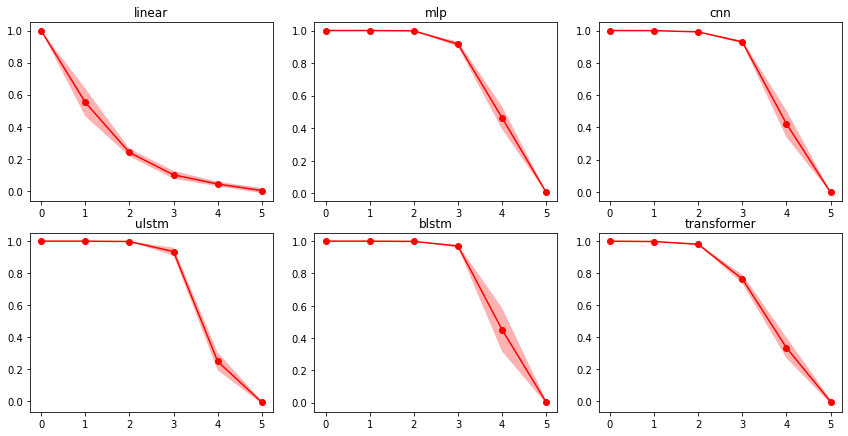

In [11]:
fig,ax = plt.subplots(nrows=2, ncols=3,figsize = (12, 6))
fig.tight_layout()
for index, axis in enumerate(ax.ravel()): 
    model_name    = model_names[index]
    model_results = results[model_name]

    model_mean    = np.mean(model_results, axis=1)
    model_std     = np.std(model_results, axis=1)
    pearson_mean  = [model_mean[k_val][2] for k_val in range(model_results.shape[0])]
    mse_mean      = [model_mean[k_val][1] for k_val in range(model_results.shape[0])]
    spearman_mean = np.array([model_mean[k_val][3] for k_val in range(model_results.shape[0])])
    spearman_std  = np.array([model_std[k_val][3] for k_val in range(model_results.shape[0])])
    x = range(SEQ_LEN)
    #r2_mean       = [model_mean[k_val][0] for k_val in range(model_results.shape[0])]
    #axis.plot(pearson_mean, c='k')
    axis.plot(spearman_mean, c='r', marker='o')
    axis.fill_between(x, spearman_mean-spearman_std, spearman_mean+spearman_std,facecolor='r', alpha=0.3)
    axis.set_title(model_name)
    #axis.plot(r2_mean, c='b')
plt.savefig()


The above results indicate that hyperparameter optimisation had very little effect. Indeed, MLP and bLSTM have significantly better overall performance at hyperparameters of K=3 than hyperparameters at their respective K value (see FIGURE1.ipynb). Only CNN performance has diminished at K=4, and that within error. 

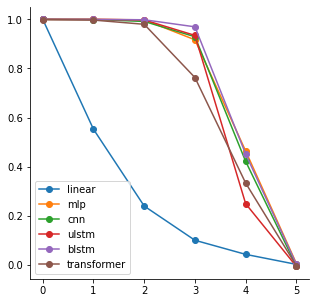

In [12]:
fig,ax = plt.subplots(nrows=1, ncols=1,figsize = (5, 5))
#fig.tight_layout()
for index, model_name in enumerate(model_names): 
    model_name    = model_names[index]
    model_results = results[model_name]

    model_mean    = np.mean(model_results, axis=1)
    model_std     = np.std(model_results, axis=1)
    pearson_mean  = [model_mean[k_val][2] for k_val in range(model_results.shape[0])]
    mse_mean      = [model_mean[k_val][1] for k_val in range(model_results.shape[0])]
    spearman_mean = np.array([model_mean[k_val][3] for k_val in range(model_results.shape[0])])
    spearman_std  = np.array([model_std[k_val][3] for k_val in range(model_results.shape[0])])
    x = range(SEQ_LEN)
    #r2_mean       = [model_mean[k_val][0] for k_val in range(model_results.shape[0])]
    #axis.plot(pearson_mean, c='k')
    ax.plot(spearman_mean, marker='o', label = model_name)
    #ax.fill_between(x, spearman_mean-spearman_std, spearman_mean+spearman_std, alpha=0.3)
    #ax.set_title(model_name)
    #axis.plot(r2_mean, c='b')
ax.legend()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

## Latent representation results

In [38]:
list(models_dict['transformer'][0][0].children())[-2]



TransformerEncoder(
  (layers): ModuleList(
    (0-1): 2 x TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
      )
      (linear1): Linear(in_features=128, out_features=128, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=128, out_features=128, bias=True)
      (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
    )
  )
)

In [56]:
torch.cuda.is_available()

True

In [13]:

def get_latent_representationw(model, model_name,  x_data):
    # Variable to store the final layer activation
    final_activation = None
    # Define a forward hook callback function to capture the output
    def forward_hook(module, input, output):
        nonlocal final_activation  # Use nonlocal to modify the variable outside the inner function
        final_activation = output

    # Attach the hook to the final layer of the model
    if model_name == 'mlp': 
        final_layer = model.fc_layers[-1]
        hook_handle = final_layer.register_forward_hook(forward_hook)
    elif model_name == 'cnn': 
        final_layer = list(model.children())[-2] #gets the final MaxPool1d layer 
        hook_handle = final_layer.register_forward_hook(forward_hook)
    elif model_name == 'ulstm' or model_name=='blstm': 
        hook_handle = model.lstm.register_forward_hook(forward_hook)
    elif model_name == 'transformer': 
        final_layer = list(model.children())[-2] #gets output of Transformer module
        hook_handle = final_layer.register_forward_hook(forward_hook)

    else: 
        raise Exception('Model name not recognised.')

    
    
    # Run a forward pass
    _ = model(x_data)

    # Remove the hook to prevent side effects
    hook_handle.remove()

    if model_name =='ulstm' or model_name=='blstm': 
        final_activation = final_activation[0][:, -1, :]
    # Return the captured activation
    return final_activation.detach()


In [14]:
landscapes_as_tensor = [[torch.from_numpy(i).to(torch.float32) for i in j[0]] for j in splits]
flattened_landscapes = [[i.reshape(i.shape[0], i.shape[1]*i.shape[2]) for i in j[0]] for j in splits]

In [15]:
import os
os.environ["OPENBLAS_NUM_THREADS"] = "1"


In [16]:
degree=30

In [17]:
#compute final layer activations 

mlp_latent_reps = [[get_latent_representationw(mlp_models[i][j],'mlp', landscapes_as_tensor[i][j]) for j in range(N_REPLICATES)] for i in range(len(mlp_models))]
cnn_latent_reps = [[get_latent_representationw(cnn_models[i][j],'cnn', landscapes_as_tensor[i][j]) for j in range(N_REPLICATES)] for i in range(len(cnn_models))]
ulstm_latent_reps = [[get_latent_representationw(ulstm_models[i][j],'ulstm', landscapes_as_tensor[i][j]) for j in range(N_REPLICATES)] for i in range(len(ulstm_models))]
blstm_latent_reps = [[get_latent_representationw(blstm_models[i][j],'blstm', landscapes_as_tensor[i][j]) for j in range(N_REPLICATES)] for i in range(len(blstm_models))]
transformer_latent_reps = [[get_latent_representationw(transformer_models[i][j],'transformer', landscapes_as_tensor[i][j]) for j in range(N_REPLICATES)] for i in range(len(transformer_models))]

In [18]:
#v = kneighbors_graph(flattened_landscapes[0][0], n_neighbors=degree, n_jobs=-1) 

In [84]:
transformer_latent_reps[0][0][-1].shape

torch.Size([46656, 128])

#### Calculate KNNs 

In [20]:
knn_landscapes = [[kneighbors_graph(flattened_landscapes[i][j], n_neighbors=degree, n_jobs=-1) for j in range(N_REPLICATES) ] for i in range(SEQ_LEN)]

In [21]:
knn_mlp_layers = [[kneighbors_graph(mlp_latent_reps[i][j], n_neighbors=degree, n_jobs=-1) for j in range(N_REPLICATES) ]for i in range(len(mlp_latent_reps))]

In [22]:
knn_cnn_layers = [[kneighbors_graph(cnn_latent_reps[i][j].squeeze(), n_neighbors=degree, n_jobs=-1) for j in range(N_REPLICATES) ]for i in range(len(cnn_latent_reps))]

In [ ]:
knn_ulstm_layers = [[kneighbors_graph(ulstm_latent_reps[i][j], n_neighbors=degree, n_jobs=-1) for j in range(N_REPLICATES) ]for i in range(len(ulstm_latent_reps))]

In [ ]:
knn_blstm_layers = [[kneighbors_graph(blstm_latent_reps[i][j], n_neighbors=degree, n_jobs=-1) for j in range(N_REPLICATES) ]for i in range(len(blstm_latent_reps))]

In [ ]:
knn_transformer_layers = [[kneighbors_graph(transformer_latent_reps[i][j][-1], n_neighbors=degree, n_jobs=-1) for j in range(N_REPLICATES) ]for i in range(len(transformer_latent_reps))]

In [ ]:
#make the adjacencies symmetrical
knn_nk_landscapes_symA = [[A.maximum(A.T) for A in j] for j in knn_landscapes]
knn_mlp_layers_symA = [[A.maximum(A.T) for A in j] for j in knn_mlp_layers]
knn_cnn_layers_symA = [[A.maximum(A.T) for A in j] for j in knn_cnn_layers]
knn_ulstm_layers_symA = [[A.maximum(A.T) for A in j] for j in knn_ulstm_layers]
knn_blstm_layers_symA = [[A.maximum(A.T) for A in j] for j in knn_blstm_layers]
knn_transformer_layers_symA = [[A.maximum(A.T) for A in j] for j in knn_transformer_layers]

In [ ]:
#check if all entries of A positive
"""
for k in knn_nk_landscapes_symA: 
    for A in k: 
        min_A = A.min()
        if min_A < 0:
            print(f"Minimum value in adjacency matrix A: {min_A}")
            raise ValueError("Adjacency matrix contains negative values.")
        else:
            print("Adjacency matrix contains no negative values.")
        if (A != A.T).nnz == 0:
            print("Adjacency matrix is symmetric.")
        else:
            print("Adjacency matrix is not symmetric.")
            # Optionally print the number of asymmetric entries
            asymmetric_entries = (A != A.T).nnz
            print(f"Number of asymmetric entries: {asymmetric_entries}")
        if not np.isfinite(A.data).all():
            raise ValueError("Adjacency matrix contains NaN or Inf values.")
        else:
            print("Adjacency matrix contains no NaN or Inf values.")"""


In [26]:
#check laplacians
"""
for k in knn_mlp_laplacians: 
    for L in k: 
        if (L != L.T).nnz == 0:
            print("Laplacian matrix is symmetric.")
        else:
            print("Laplacian matrix is not symmetric.")"""


'\nfor k in knn_mlp_laplacians: \n    for L in k: \n        if (L != L.T).nnz == 0:\n            print("Laplacian matrix is symmetric.")\n        else:\n            print("Laplacian matrix is not symmetric.")'

In [28]:
def adjacency_to_diag_laplacian(A): 
    """
    Calculates degree and Laplacian matrices from an adjacency matrix.  
    
    Args: 
        A (scipy sparse matrix): adjacency of graph
    Returns: 
        D (scipy sparse matrix): degree matrix of graph
        L (scipy sparse matrix): Laplacian matrix of graph
    """
    # Check for negative entries in A
    if A.min() < 0:
        raise ValueError("Adjacency matrix has negative values.")
    
    # Ensure A is symmetric
    if (A != A.T).nnz != 0:
        raise ValueError("Adjacency matrix is not symmetric for an undirected graph.")
    
    degrees = np.array(A.sum(axis=1)).flatten()
    # Check for negative degrees
    if degrees.min() < 0:
        raise ValueError("Degree matrix has negative values.")
    
    D = diags(degrees, format='csr')
    L = D - A
    return D, L

def sparse_dirichlet(L, f): 
    """
    Calculates the Dirichlet energy of a signal f over a graph. 
    
    Args: 
        L (scipy sparse matrix): graph Laplacian
        f (np array): signal over graph
    """
    f = f.astype('float64')
    L = L.astype('float64')

    #min_eigval = eigsh(L, k=1, which='SA', return_eigenvectors=False)[0]
    #if min_eigval < -1e-10:
        #raise ValueError("Laplacian matrix is not positive semi-definite.")

    
    Lf = L.dot(f)
    fLf = f.T @ Lf  # Ensures matrix-vector product

    # Allow for minor numerical errors
    tol = 1e-10
    if fLf < -tol:
        raise ValueError(f"Dirichlet energy is negative: {fLf}")

    return fLf.item()


In [ ]:
#compute laplacians
knn_nk_laplacians = [[adjacency_to_diag_laplacian(i)[1] for i in j] for j in knn_nk_landscapes_symA]
knn_mlp_laplacians = [[adjacency_to_diag_laplacian(i)[1] for i in j] for j in knn_mlp_layers_symA]
knn_cnn_laplacians = [[adjacency_to_diag_laplacian(i)[1] for i in j] for j in knn_cnn_layers_symA]
knn_ulstm_laplacians = [[adjacency_to_diag_laplacian(i)[1] for i in j] for j in knn_ulstm_layers_symA]
knn_blstm_laplacians = [[adjacency_to_diag_laplacian(i)[1] for i in j] for j in knn_blstm_layers_symA]
knn_transformer_laplacians = [[adjacency_to_diag_laplacian(i)[1] for i in j] for j in knn_transformer_layers_symA]

In [ ]:
landscapes_y       = [[i.fitnesses.reshape(-1,1) for i in j] for j in landscapes]

In [ ]:
#compute dirichlet energies
nk_dirichlets  = np.array([[sparse_dirichlet(knn_nk_laplacians[i][j], landscapes_y[i][j]) for j in range(N_REPLICATES)] for i in range(SEQ_LEN)])
mlp_dirichlets = np.array([[sparse_dirichlet(knn_mlp_laplacians[i][j], landscapes_y[i][j]) for j in range(N_REPLICATES)] for i in range(SEQ_LEN)])
cnn_dirichlets = np.array([[sparse_dirichlet(knn_cnn_laplacians[i][j], landscapes_y[i][j]) for j in range(N_REPLICATES)] for i in range(SEQ_LEN)])
ulstm_dirichlets = np.array([[sparse_dirichlet(knn_ulstm_laplacians[i][j], landscapes_y[i][j]) for j in range(N_REPLICATES)] for i in range(SEQ_LEN)])
blstm_dirichlets = np.array([[sparse_dirichlet(knn_blstm_laplacians[i][j], landscapes_y[i][j]) for j in range(N_REPLICATES)] for i in range(SEQ_LEN)])
transformer_dirichlets = np.array([[sparse_dirichlet(knn_transformer_laplacians[i][j], landscapes_y[i][j]) for j in range(N_REPLICATES)] for i in range(SEQ_LEN)])


In [ ]:
nk_dirichlets_means, nk_dirichlets_std = np.mean(nk_dirichlets, axis=1), np.std(nk_dirichlets, axis=1)
mlp_dirichlets_means, mlp_dirichlets_std = np.mean(mlp_dirichlets, axis=1), np.std(mlp_dirichlets, axis=1)
cnn_dirichlets_means, cnn_dirichlets_std = np.mean(cnn_dirichlets, axis=1), np.std(cnn_dirichlets, axis=1)
ulstm_dirichlets_means, ulstm_dirichlets_std = np.mean(ulstm_dirichlets, axis=1), np.std(ulstm_dirichlets, axis=1)
blstm_dirichlets_means, blstm_dirichlets_std = np.mean(blstm_dirichlets, axis=1), np.std(blstm_dirichlets, axis=1)
transformer_dirichlets_means, transformer_dirichlets_std = np.mean(transformer_dirichlets, axis=1), np.std(transformer_dirichlets, axis=1)


In [ ]:
dirichlet_means = [nk_dirichlets_means, mlp_dirichlets_means,cnn_dirichlets_means,ulstm_dirichlets_means,blstm_dirichlets_means,transformer_dirichlets_means]
dirichlet_stds  = [nk_dirichlets_std, mlp_dirichlets_std,cnn_dirichlets_std,ulstm_dirichlets_std,blstm_dirichlets_std,transformer_dirichlets_std]



In [ ]:
fig,ax = plt.subplots(nrows=1, ncols=5, figsize=(15,5))
fig.tight_layout()
for index, axis in enumerate(ax.ravel()):    

    if index == 0: 
        axis.plot(mlp_dirichlets_means, c='b', marker='o')
        axis.fill_between(x, mlp_dirichlets_means-mlp_dirichlets_std, mlp_dirichlets_means+mlp_dirichlets_std,facecolor='b', alpha=0.3)
        axis.plot(nk_dirichlets_means, c='k', marker='o')
        axis.fill_between(x, nk_dirichlets_means-nk_dirichlets_std, nk_dirichlets_means+nk_dirichlets_std,facecolor='k', alpha=0.3)

        axis.set_title('mlp latent rep DE')
        axis.set_ylim(-1000,60000)
    elif index==1: 
        axis.plot(cnn_dirichlets_means, c='b', marker='o')
        axis.fill_between(x, cnn_dirichlets_means-cnn_dirichlets_std, cnn_dirichlets_means+cnn_dirichlets_std,facecolor='b', alpha=0.3)
        axis.plot(nk_dirichlets_means, c='k', marker='o')
        axis.fill_between(x, nk_dirichlets_means-nk_dirichlets_std, nk_dirichlets_means+nk_dirichlets_std,facecolor='k', alpha=0.3)

        axis.set_title('cnn latent rep DE')
        axis.set_ylim(-1000,60000)
    elif index==2: 
        axis.plot(ulstm_dirichlets_means, c='b', marker='o')
        axis.fill_between(x, ulstm_dirichlets_means-ulstm_dirichlets_std, ulstm_dirichlets_means+ulstm_dirichlets_std,facecolor='b', alpha=0.3)
        axis.plot(nk_dirichlets_means, c='k', marker='o')
        axis.fill_between(x, nk_dirichlets_means-nk_dirichlets_std, nk_dirichlets_means+nk_dirichlets_std,facecolor='k', alpha=0.3)

        axis.set_title('ulstm latent rep DE')
        axis.set_ylim(-1000,60000)
    elif index==3: 
        axis.plot(blstm_dirichlets_means, c='b', marker='o')
        axis.fill_between(x, blstm_dirichlets_means-blstm_dirichlets_std, blstm_dirichlets_means+blstm_dirichlets_std,facecolor='b', alpha=0.3)
        axis.plot(nk_dirichlets_means, c='k', marker='o')
        axis.fill_between(x, nk_dirichlets_means-nk_dirichlets_std, nk_dirichlets_means+nk_dirichlets_std,facecolor='k', alpha=0.3)

        axis.set_title('blstm latent rep DE')
        axis.set_ylim(-1000,60000)

    elif index==4: 
        axis.plot(transformer_dirichlets_means, c='b', marker='o')
        axis.fill_between(x, transformer_dirichlets_means-transformer_dirichlets_std, transformer_dirichlets_means+transformer_dirichlets_std,facecolor='b', alpha=0.3)
        axis.plot(nk_dirichlets_means, c='k', marker='o')
        axis.fill_between(x, nk_dirichlets_means-nk_dirichlets_std, nk_dirichlets_means+nk_dirichlets_std,facecolor='k', alpha=0.3)

        axis.set_title('transformer latent rep DE')
        axis.set_ylim(-1000,60000)
ax[0].set_ylabel('KNN Dirichlet Energy')
    
    
    

In [34]:
np.random.randint(10000000,100000000 )

89112709

Text(108.125, 0.5, 'Spearman rho')

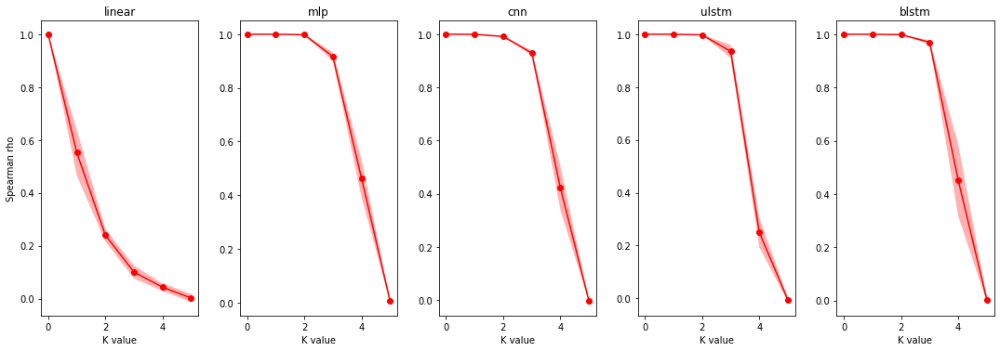

In [35]:
fig,ax = plt.subplots(nrows=1, ncols=5,figsize = (15, 5))
fig.tight_layout()
for index, axis in enumerate(ax.ravel()): 
    model_name    = model_names[index]
    model_results = results[model_name]

    model_mean    = np.mean(model_results, axis=1)
    model_std     = np.std(model_results, axis=1)
    pearson_mean  = [model_mean[k_val][2] for k_val in range(model_results.shape[0])]
    mse_mean      = [model_mean[k_val][1] for k_val in range(model_results.shape[0])]
    spearman_mean = np.array([model_mean[k_val][3] for k_val in range(model_results.shape[0])])
    spearman_std  = np.array([model_std[k_val][3] for k_val in range(model_results.shape[0])])
    x = range(SEQ_LEN)
    #r2_mean       = [model_mean[k_val][0] for k_val in range(model_results.shape[0])]
    #axis.plot(pearson_mean, c='k')
    axis.plot(spearman_mean, c='r', marker='o')
    axis.fill_between(x, spearman_mean-spearman_std, spearman_mean+spearman_std,facecolor='r', alpha=0.3)
    axis.set_title(model_name)
    axis.set_xlabel('K value')
    
    #axis.plot(r2_mean, c='b')
ax[0].set_ylabel('Spearman rho')

## UMAP and KNN Visualisation

In [97]:
from sklearn.manifold import TSNE

In [98]:
from cuml.manifold import UMAP
import cugraph
import cudf

2024-11-09 14:45:38.285469: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-09 14:45:38.296985: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1731163538.309936   22052 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1731163538.313810   22052 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-09 14:45:38.327439: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

In [39]:
import time

In [148]:
#mlp_graphs = [[cugraph.force_atlas2(nx.from_scipy_sparse_array(i)) for i in j ] for j in knn_mlp_layers]

In [99]:
mlp_nx_graphs = [[nx.from_scipy_sparse_array(i) for i in j] for j in knn_mlp_layers ]
cnn_nx_graphs = [[nx.from_scipy_sparse_array(i) for i in j] for j in knn_cnn_layers ]
ulstm_nx_graphs = [[nx.from_scipy_sparse_array(i) for i in j] for j in knn_ulstm_layers ]
blstm_nx_graphs = [[nx.from_scipy_sparse_array(i) for i in j] for j in knn_blstm_layers ]


In [101]:
tranformer_nx_graphs = [[nx.from_scipy_sparse_array(i) for i in j] for j in knn_transformer_layers ]


In [102]:
mlp_graphs = [[cugraph.force_atlas2(i) for i in j ] for j in mlp_nx_graphs]
cnn_graphs = [[cugraph.force_atlas2(i) for i in j ] for j in cnn_nx_graphs]
ulstm_graphs = [[cugraph.force_atlas2(i) for i in j ] for j in ulstm_nx_graphs]
blstm_graphs = [[cugraph.force_atlas2(i) for i in j ] for j in blstm_nx_graphs]


NameError: name 'transformer_nx_graphs' is not defined

In [103]:
transformer_graphs = [[cugraph.force_atlas2(i) for i in j ] for j in tranformer_nx_graphs]

In [104]:
mlp_layouts = [[{int(row['vertex']): (row['x'], row['y'])for _, row in i.to_pandas().iterrows()} for i in j] for j in mlp_graphs]
cnn_layouts = [[{int(row['vertex']): (row['x'], row['y'])for _, row in i.to_pandas().iterrows()} for i in j] for j in cnn_graphs]
ulstm_layouts = [[{int(row['vertex']): (row['x'], row['y'])for _, row in i.to_pandas().iterrows()} for i in j] for j in ulstm_graphs]
blstm_layouts = [[{int(row['vertex']): (row['x'], row['y'])for _, row in i.to_pandas().iterrows()} for i in j] for j in blstm_graphs]
transformer_layouts = [[{int(row['vertex']): (row['x'], row['y'])for _, row in i.to_pandas().iterrows()} for i in j] for j in transformer_graphs]

In [ ]:
mlp_umaps = [[UMAP(n_components=2, n_neighbors=40, min_dist=0.5, local_connectivity=20).fit_transform(i.numpy()) for i in j] for j in mlp_latent_reps]
cnn_umaps = [[UMAP(n_components=2, n_neighbors=40, min_dist=0.5, local_connectivity=20).fit_transform(i.squeeze().numpy()) for i in j] for j in cnn_latent_reps]
ulstm_umaps = [[UMAP(n_components=2, n_neighbors=40, min_dist=0.5, local_connectivity=20).fit_transform(i.squeeze().numpy()) for i in j] for j in ulstm_latent_reps]
blstm_umaps = [[UMAP(n_components=2, n_neighbors=40, min_dist=0.5, local_connectivity=20).fit_transform(i.squeeze().numpy()) for i in j] for j in blstm_latent_reps]


In [ ]:
import matplotlib as mpl

In [107]:
from scipy.stats import spearmanr

In [108]:
results['mlp'][:, :, -1].ravel()

array([0.99999547, 0.9999963 , 0.99998808, 0.9999969 , 0.99994433,
       0.99988961, 0.99990731, 0.99995011, 0.99624836, 0.99714351,
       0.99907315, 0.99951923, 0.93873149, 0.91177022, 0.92060602,
       0.89597505, 0.40280223, 0.38790423, 0.51173431, 0.55322891,
       0.00217138, 0.00745597, 0.00255849, 0.01167155])

In [109]:
mlp_de_rho_rho, mlp__rho_p = spearmanr(mlp_dirichlets.ravel(),results['mlp'][:, :, -1].ravel())
cnn_de_rho_rho, cnn__rho_p = spearmanr(cnn_dirichlets.ravel(),results['cnn'][:, :, -1].ravel())
ulstm_de_rho_rho, ulstm__rho_p = spearmanr(ulstm_dirichlets.ravel(),results['ulstm'][:, :, -1].ravel())
blstm_de_rho_rho, blstm__rho_p = spearmanr(blstm_dirichlets.ravel(),results['blstm'][:, :, -1].ravel())
transformer_de_rho_rho, transformer__rho_p = spearmanr(transformer_dirichlets.ravel(),results['transformer'][:, :, -1].ravel())


mlp_de_mse_rho, mlp__mse_p = spearmanr(mlp_dirichlets.ravel(),results['mlp'][:, :, 1].ravel())
cnn_de_mse_rho, cnn__mse_p = spearmanr(cnn_dirichlets.ravel(),results['cnn'][:, :, 1].ravel())
ulstm_de_mse_rho, ulstm__mse_p = spearmanr(ulstm_dirichlets.ravel(),results['ulstm'][:, :, 1].ravel())
blstm_de_mse_rho, blstm__mse_p = spearmanr(blstm_dirichlets.ravel(),results['blstm'][:, :, 1].ravel())
transformer_de_mse_rho, transformer__mse_p = spearmanr(transformer_dirichlets.ravel(),results['transformer'][:, :, 1].ravel())


In [110]:
de_rho_rho = np.array([[mlp_de_rho_rho, mlp__rho_p], [cnn_de_rho_rho, cnn__rho_p], [ulstm_de_rho_rho, ulstm__rho_p], [blstm_de_rho_rho, blstm__rho_p], [transformer_de_rho_rho, transformer__rho_p]])
de_mse_rho = np.array([[mlp_de_mse_rho, mlp__mse_p], [cnn_de_mse_rho, cnn__mse_p], [ulstm_de_mse_rho, ulstm__mse_p], [blstm_de_mse_rho, blstm__mse_p], [transformer_de_mse_rho, transformer__mse_p]])



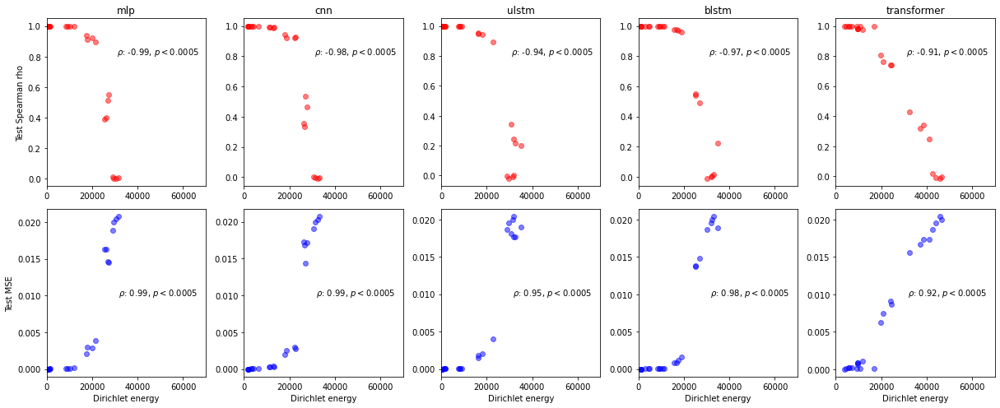

In [114]:
fig,ax = plt.subplots(nrows=2, ncols=5,figsize = (17,7))
ax[0, 0].scatter(mlp_dirichlets.ravel(),results['mlp'][:, :, -1].ravel(), c='r', alpha=0.5)
ax[0, 1].scatter(cnn_dirichlets.ravel(),results['cnn'][:, :, -1].ravel(), c='r', alpha=0.5)
ax[0, 2].scatter(ulstm_dirichlets.ravel(),results['ulstm'][:, :, -1].ravel(), c='r', alpha=0.5)
ax[0, 3].scatter(blstm_dirichlets.ravel(),results['blstm'][:, :, -1].ravel(), c='r', alpha=0.5)
ax[0, 4].scatter(transformer_dirichlets.ravel(),results['transformer'][:, :, -1].ravel(), c='r', alpha=0.5)

ax[0, 0].set_ylabel('Test Spearman rho')

ax[1, 0].scatter(mlp_dirichlets.ravel(),results['mlp'][:, :, 1].ravel(), c='b', alpha=0.5)
ax[1, 1].scatter(cnn_dirichlets.ravel(),results['cnn'][:, :, 1].ravel(), c='b', alpha=0.5)
ax[1, 2].scatter(ulstm_dirichlets.ravel(),results['ulstm'][:, :, 1].ravel(), c='b', alpha=0.5)
ax[1, 3].scatter(blstm_dirichlets.ravel(),results['blstm'][:, :, 1].ravel(), c='b', alpha=0.5)
ax[1, 4].scatter(transformer_dirichlets.ravel(),results['transformer'][:, :, 1].ravel(), c='b', alpha=0.5)

for axis in ax.ravel(): 
    axis.set_xlim(0, 70000)    
    #axis.set_xlabel('Dirichlet energy')
for axis in ax[1].ravel(): 
    axis.set_xlabel('Dirichlet energy')

ax[1,0].set_ylabel('Test MSE')

ax[0,0].set_title('mlp')
ax[0,1].set_title('cnn')
ax[0,2].set_title('ulstm')
ax[0,3].set_title('blstm')
ax[0,4].set_title('transformer')



for index, axis in enumerate(ax[0].ravel()): 
    axis.text(0.7, 0.8, r'$\rho$: {}, $p <0.0005$'.format(np.around(de_rho_rho[:,0][index], decimals=2)), fontsize=10, ha='center', va='center', transform=ax[0, index].transAxes)

for index, axis in enumerate(ax[1].ravel()): 
    axis.text(0.7, 0.5, r'$\rho$: {}, $p <0.0005$'.format(np.around(de_mse_rho[:,0][index], decimals=2)), fontsize=10, ha='center', va='center', transform=ax[1, index].transAxes)
    axis.set_yticks([0.000, 0.005, 0.010, 0.015, 0.020])
plt.tight_layout()
plt.savefig('../figures/latent-dirichlet-energy-vs-mse-spearman-rho.svg')


#fig.suptitle("Latent Representation Dirichlet Energy vs Spearman rho", fontsize=14, y=0.96)


In [115]:
nk_nx_graphs = [[nx.from_scipy_sparse_array(i) for i in j] for j in knn_landscapes ]


In [116]:
nk_graphs = [[cugraph.force_atlas2(i) for i in j ] for j in nk_nx_graphs]
nk_layouts = [[{int(row['vertex']): (row['x'], row['y'])for _, row in i.to_pandas().iterrows()} for i in j] for j in nk_graphs]


In [ ]:
nk_d

Text(0.5, 0.915, 'K-Nearest Neighbour Graphs of NK Landscapes')

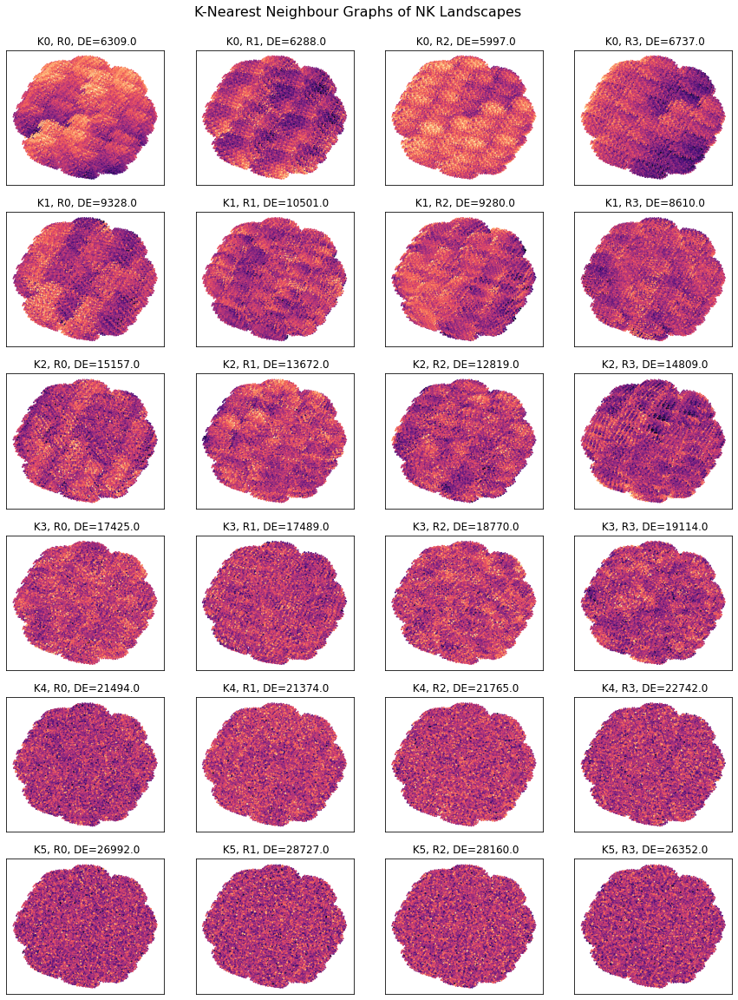

In [110]:
fig,ax = plt.subplots(nrows=6, ncols=4,figsize = (15, 20))

for k_index in range(SEQ_LEN): 
    for replicate_index in range(N_REPLICATES): 
        nx.draw_networkx_nodes(nk_nx_graphs[k_index][replicate_index], nk_layouts[k_index][replicate_index], 
                               node_color=landscapes_y[k_index][replicate_index],cmap='magma', ax=ax[k_index][replicate_index], node_size=1)
        ax[k_index, replicate_index].set_title(' K{}, R{}, DE={}'.format(k_index, replicate_index, 
                                                                                 np.around(nk_dirichlets[k_index][replicate_index], decimals=0)))                                                              
#for axis in ax.ravel(): 
#    axis.spines[['right', 'top', 'bottom', 'left']].set_visible(False)

fig.suptitle("K-Nearest Neighbour Graphs of NK Landscapes", fontsize=16, y=0.915)
#plt.tight_layout(rect=[0, 0, 1, 0.95])

Text(0.5, 0.915, 'UMAP of MLP Latent Representation of NK Landscapes')

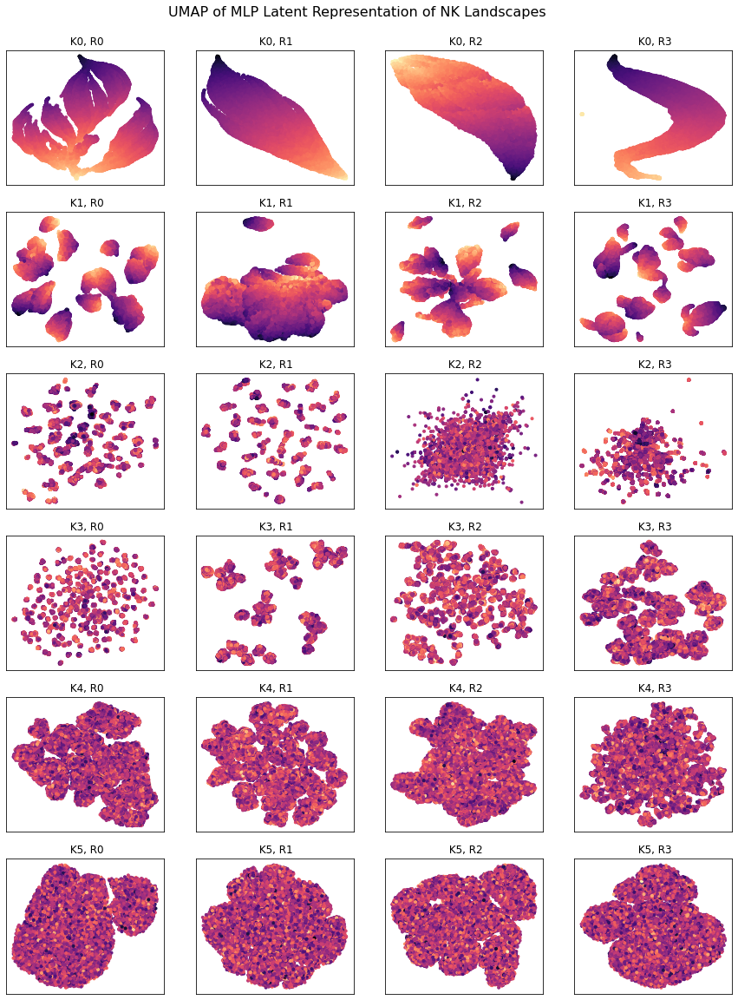

In [66]:
fig,ax = plt.subplots(nrows=6, ncols=4,figsize = (15, 20))

for k_index in range(SEQ_LEN): 
    for replicate_index in range(N_REPLICATES): 
        ax[k_index, replicate_index].scatter(mlp_umaps[k_index][replicate_index][:,0], mlp_umaps[k_index][replicate_index][:,1], marker='.', alpha=1, c=landscapes_y[k_index][replicate_index], cmap='magma')
        ax[k_index, replicate_index].set_title(' K{}, R{}'.format(k_index, replicate_index))
        ax[k_index, replicate_index].set_xticks([])
        ax[k_index, replicate_index].set_yticks([])
#for axis in ax.ravel(): 
    #axis.spines[['right', 'top', 'bottom', 'left']].set_visible(False)
fig.suptitle("UMAP of MLP Latent Representation of NK Landscapes", fontsize=16, y=0.915)

Text(0.5, 0.915, 'K-Nearest Neighbour Graphs for the MLP Latent Representation of NK Landscapes')

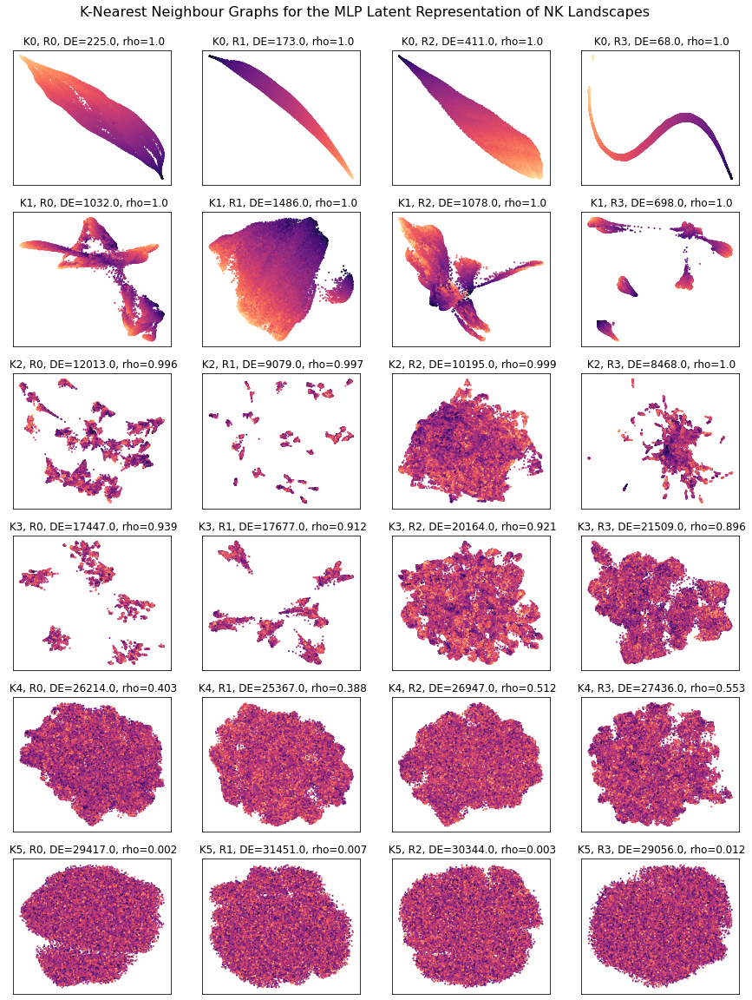

In [97]:
fig,ax = plt.subplots(nrows=6, ncols=4,figsize = (15, 20))

for k_index in range(SEQ_LEN): 
    for replicate_index in range(N_REPLICATES): 
        nx.draw_networkx_nodes(mlp_nx_graphs[k_index][replicate_index], mlp_layouts[k_index][replicate_index], 
                               node_color=landscapes_y[k_index][replicate_index],cmap='magma', ax=ax[k_index][replicate_index], node_size=1)
        ax[k_index, replicate_index].set_title(' K{}, R{}, DE={}, rho={}'.format(k_index, replicate_index, 
                                                                                 np.around(mlp_dirichlets[k_index][replicate_index], decimals=0), 
                                                                                np.around(results['mlp'][k_index][replicate_index][-1], decimals=3)))

#for axis in ax.ravel(): 
#    axis.spines[['right', 'top', 'bottom', 'left']].set_visible(False)

fig.suptitle("K-Nearest Neighbour Graphs for the MLP Latent Representation of NK Landscapes", fontsize=16, y=0.915)
#plt.tight_layout(rect=[0, 0, 1, 0.95])

Text(0.5, 0.915, 'UMAP of CNN Latent Representation of NK Landscapes')

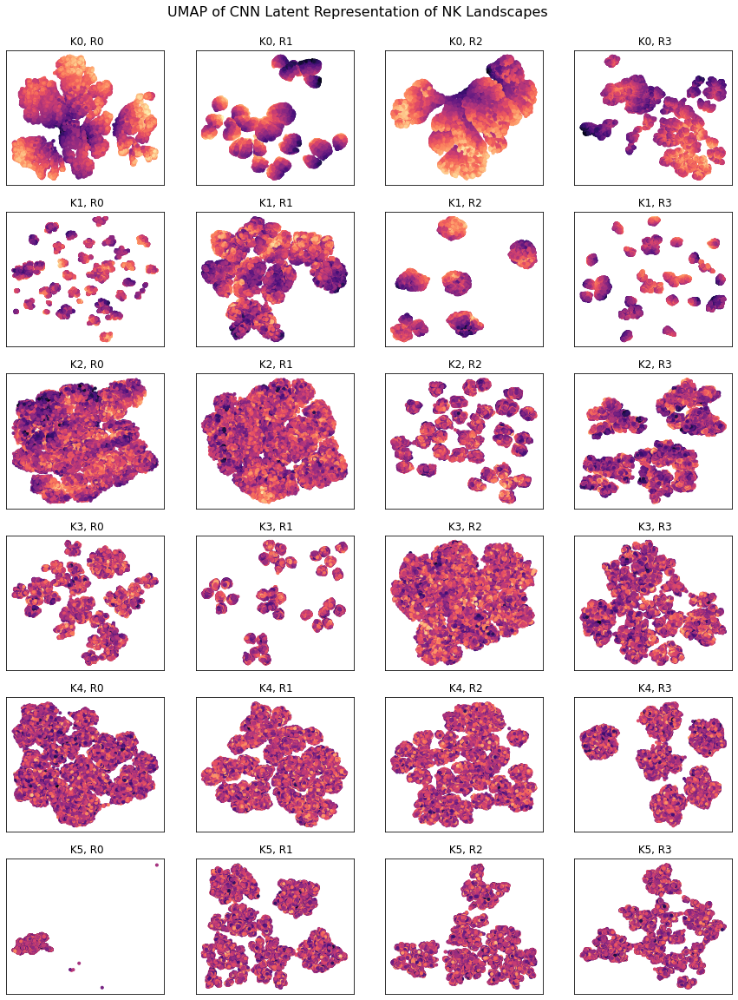

In [99]:
fig,ax = plt.subplots(nrows=6, ncols=4,figsize = (15, 20))

for k_index in range(SEQ_LEN): 
    for replicate_index in range(N_REPLICATES): 
        ax[k_index, replicate_index].scatter(cnn_umaps[k_index][replicate_index][:,0], cnn_umaps[k_index][replicate_index][:,1], marker='.', alpha=1, c=landscapes_y[k_index][replicate_index], cmap='magma')
        ax[k_index, replicate_index].set_title(' K{}, R{}'.format(k_index, replicate_index))
        ax[k_index, replicate_index].set_xticks([])
        ax[k_index, replicate_index].set_yticks([])
#for axis in ax.ravel(): 
    #axis.spines[['right', 'top', 'bottom', 'left']].set_visible(False)
fig.suptitle("UMAP of CNN Latent Representation of NK Landscapes", fontsize=16, y=0.915)

Text(0.5, 0.915, 'K-Nearest Neighbour Graphs for the CNN Latent Representation of NK Landscapes')

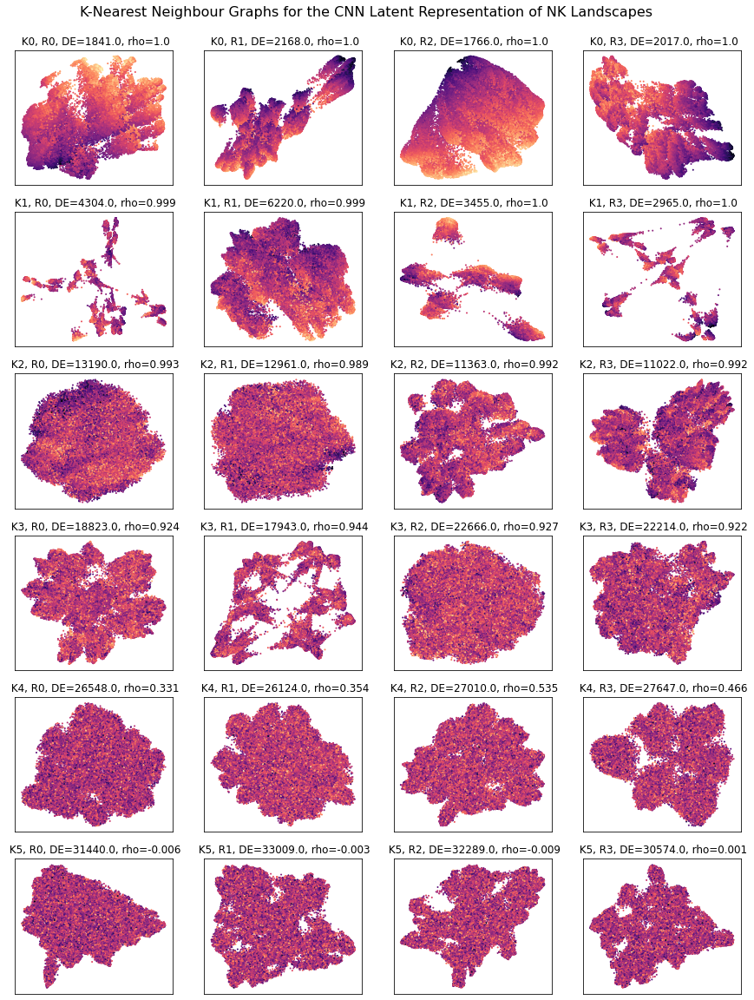

In [100]:
fig,ax = plt.subplots(nrows=6, ncols=4,figsize = (15, 20))

for k_index in range(SEQ_LEN): 
    for replicate_index in range(N_REPLICATES): 
        nx.draw_networkx_nodes(cnn_nx_graphs[k_index][replicate_index], cnn_layouts[k_index][replicate_index], 
                               node_color=landscapes_y[k_index][replicate_index],cmap='magma', ax=ax[k_index][replicate_index], node_size=1)
        ax[k_index, replicate_index].set_title(' K{}, R{}, DE={}, rho={}'.format(k_index, replicate_index, 
                                                                                 np.around(cnn_dirichlets[k_index][replicate_index], decimals=0), 
                                                                                np.around(results['cnn'][k_index][replicate_index][-1], decimals=3)))

#for axis in ax.ravel(): 
#    axis.spines[['right', 'top', 'bottom', 'left']].set_visible(False)

fig.suptitle("K-Nearest Neighbour Graphs for the CNN Latent Representation of NK Landscapes", fontsize=16, y=0.915)
#plt.tight_layout(rect=[0, 0, 1, 0.95])

Text(0.5, 0.915, 'UMAP of uLSTM Latent Representation of NK Landscapes')

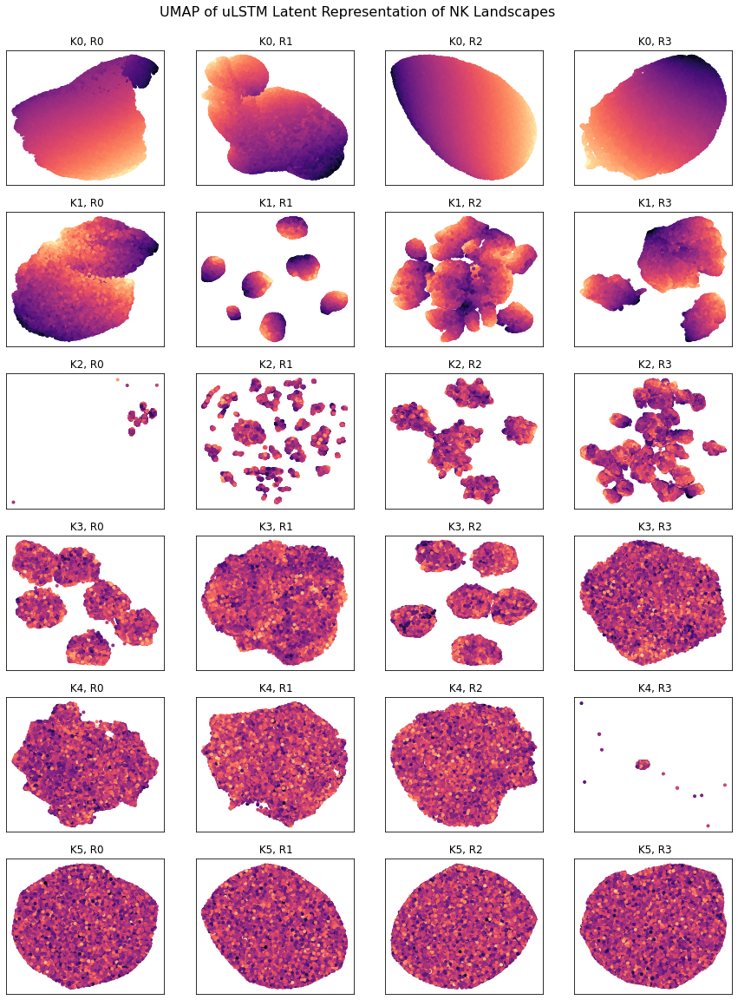

In [101]:
fig,ax = plt.subplots(nrows=6, ncols=4,figsize = (15, 20))

for k_index in range(SEQ_LEN): 
    for replicate_index in range(N_REPLICATES): 
        ax[k_index, replicate_index].scatter(ulstm_umaps[k_index][replicate_index][:,0], ulstm_umaps[k_index][replicate_index][:,1], marker='.', alpha=1, c=landscapes_y[k_index][replicate_index], cmap='magma')
        ax[k_index, replicate_index].set_title(' K{}, R{}'.format(k_index, replicate_index))
        ax[k_index, replicate_index].set_xticks([])
        ax[k_index, replicate_index].set_yticks([])
#for axis in ax.ravel(): 
    #axis.spines[['right', 'top', 'bottom', 'left']].set_visible(False)
fig.suptitle("UMAP of uLSTM Latent Representation of NK Landscapes", fontsize=16, y=0.915)

Text(0.5, 0.915, 'K-Nearest Neighbour Graphs for the uLSTM Latent Representation of NK Landscapes')

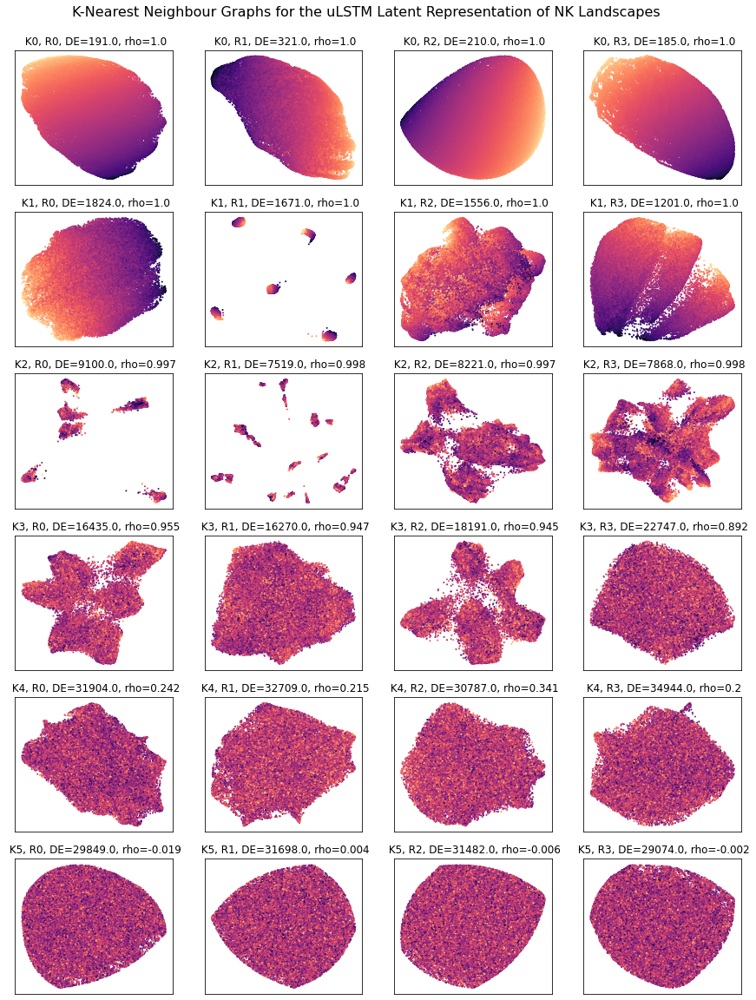

In [102]:
fig,ax = plt.subplots(nrows=6, ncols=4,figsize = (15, 20))

for k_index in range(SEQ_LEN): 
    for replicate_index in range(N_REPLICATES): 
        nx.draw_networkx_nodes(ulstm_nx_graphs[k_index][replicate_index], ulstm_layouts[k_index][replicate_index], 
                               node_color=landscapes_y[k_index][replicate_index],cmap='magma', ax=ax[k_index][replicate_index], node_size=1)
        ax[k_index, replicate_index].set_title(' K{}, R{}, DE={}, rho={}'.format(k_index, replicate_index, 
                                                                                 np.around(ulstm_dirichlets[k_index][replicate_index], decimals=0), 
                                                                                np.around(results['ulstm'][k_index][replicate_index][-1], decimals=3)))

#for axis in ax.ravel(): 
#    axis.spines[['right', 'top', 'bottom', 'left']].set_visible(False)

fig.suptitle("K-Nearest Neighbour Graphs for the uLSTM Latent Representation of NK Landscapes", fontsize=16, y=0.915)
#plt.tight_layout(rect=[0, 0, 1, 0.95])

Text(0.5, 0.915, 'UMAP of bLSTM Latent Representation of NK Landscapes')

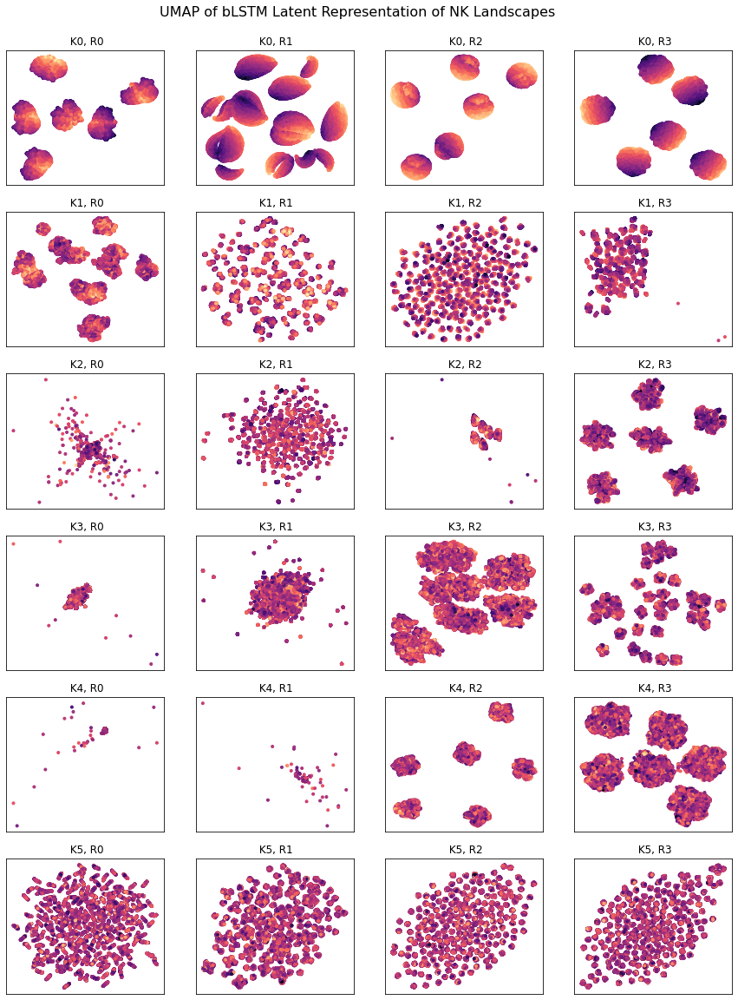

In [104]:
fig,ax = plt.subplots(nrows=6, ncols=4,figsize = (15, 20))

for k_index in range(SEQ_LEN): 
    for replicate_index in range(N_REPLICATES): 
        ax[k_index, replicate_index].scatter(blstm_umaps[k_index][replicate_index][:,0], blstm_umaps[k_index][replicate_index][:,1], marker='.', alpha=1, c=landscapes_y[k_index][replicate_index], cmap='magma')
        ax[k_index, replicate_index].set_title(' K{}, R{}'.format(k_index, replicate_index))
        ax[k_index, replicate_index].set_xticks([])
        ax[k_index, replicate_index].set_yticks([])
#for axis in ax.ravel(): 
    #axis.spines[['right', 'top', 'bottom', 'left']].set_visible(False)
fig.suptitle("UMAP of bLSTM Latent Representation of NK Landscapes", fontsize=16, y=0.915)

Text(0.5, 0.915, 'K-Nearest Neighbour Graphs for the bLSTM Latent Representation of NK Landscapes')

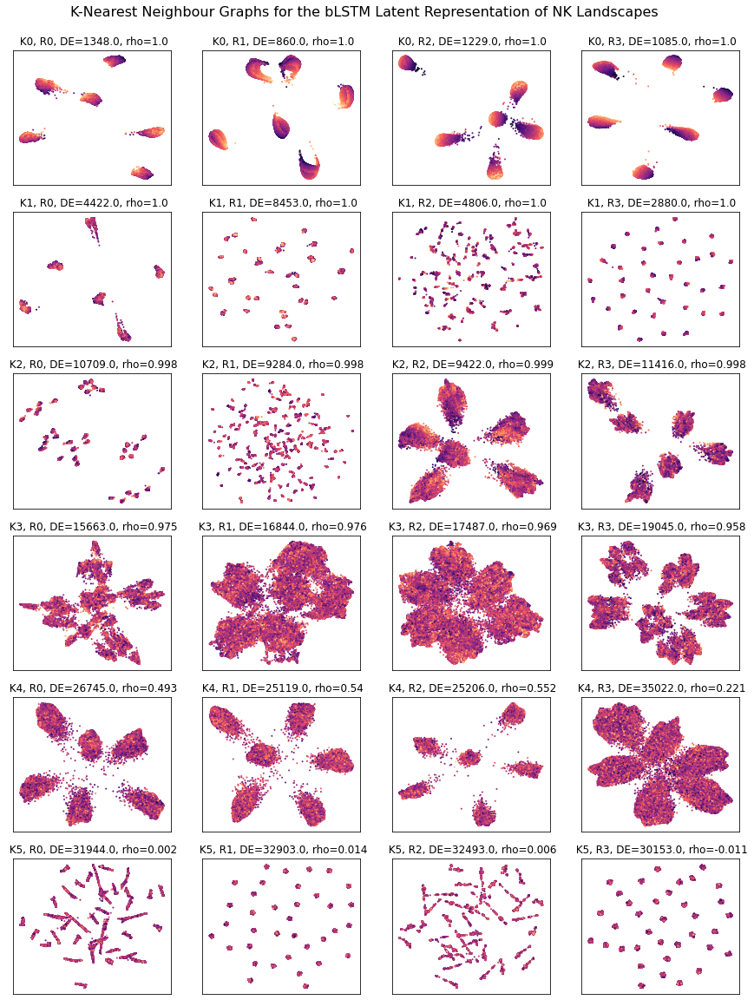

In [105]:
fig,ax = plt.subplots(nrows=6, ncols=4,figsize = (15, 20))

for k_index in range(SEQ_LEN): 
    for replicate_index in range(N_REPLICATES): 
        nx.draw_networkx_nodes(blstm_nx_graphs[k_index][replicate_index], blstm_layouts[k_index][replicate_index], 
                               node_color=landscapes_y[k_index][replicate_index],cmap='magma', ax=ax[k_index][replicate_index], node_size=1)
        ax[k_index, replicate_index].set_title(' K{}, R{}, DE={}, rho={}'.format(k_index, replicate_index, 
                                                                                 np.around(blstm_dirichlets[k_index][replicate_index], decimals=0), 
                                                                                np.around(results['blstm'][k_index][replicate_index][-1], decimals=3)))

#for axis in ax.ravel(): 
#    axis.spines[['right', 'top', 'bottom', 'left']].set_visible(False)

fig.suptitle("K-Nearest Neighbour Graphs for the bLSTM Latent Representation of NK Landscapes", fontsize=16, y=0.915)
#plt.tight_layout(rect=[0, 0, 1, 0.95])

## Compute eigenvalues and eigenvectors

In [118]:
import cupy as cp

In [124]:
knn_landscapes[1][1].shape[0]-1

46655

In [124]:
import pickle

In [126]:
with open('knn_nk_k1_r1_array.pkl', 'wb') as handle: 
    pickle.dump(knn_landscapes[1][1], handle, protocol=pickle.HIGHEST_PROTOCOL)

In [127]:
with open('knn_mlp_k1_r1_array.pkl', 'wb') as handle: 
    pickle.dump(knn_mlp_layers[1][1], handle, protocol=pickle.HIGHEST_PROTOCOL)

In [122]:
cp.get_default_memory_pool().free_all_blocks()

In [121]:
nk_k1_r1_eigvals,nk_k1_r1_eigvecs = cp.linalg.eigh(cp.array(knn_landscapes[1][1].toarray()))

MemoryError: std::bad_alloc: out_of_memory: CUDA error at: /tmp/pip-build-env-z8x7r21l/normal/lib/python3.12/site-packages/librmm/include/rmm/mr/device/cuda_memory_resource.hpp:62: cudaErrorMemoryAllocation out of memory

In [121]:
mlp_k1_r1_eigvals, mlp_k1_r1_eigvecs = eigsh(knn_mlp_layers[1][1]) 

In [122]:
nk_k1_r1_spectrum = nk_k1_r1_eigvecs.dot(landscapes_y[1][1])

ValueError: shapes (46656,6) and (46656,1) not aligned: 6 (dim 1) != 46656 (dim 0)

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Create a figure
fig = plt.figure(figsize=(10, 6))

# Create a GridSpec object with a 2x2 layout
gs = gridspec.GridSpec(2, 2, width_ratios=[2, 1], height_ratios=[1, 2])

# Add subplots with different sizes
ax1 = fig.add_subplot(gs[0, 0])  # Large subplot (top-left)
ax2 = fig.add_subplot(gs[0, 1])  # Smaller subplot (top-right)
ax3 = fig.add_subplot(gs[1, :])  # Large subplot spanning the entire bottom row
